# Nucleus Segmentation Tutorial (10x)

HueTracerでの10x Visium HD向け核セグメンテーションとbin-to-cell変換の流れを、画像領域の選択から結果保存まで一通り実行するノートブックです。

## Notebook Overview

This notebook demonstrates the end-to-end nucleus segmentation workflow for 10x Visium HD data in HueTracer.

- Load runtime configuration and initialize the analysis environment.
- Select the spatial image region and prepare Bin2Cell inputs.
- Segment nuclei from the H&E image and integrate labels into spatial data.
- Convert bins to cells with optional gene expression aggregation and QC summaries.
- Save the resulting AnnData object for downstream tutorials.

## Environment Setup and Imports

In [1]:
# =========================
# Library Imports
# =========================

import os
import gc
import warnings
from datetime import datetime
from pathlib import Path

# Image processing and segmentation
from stardist.models import StarDist2D
import imagecodecs
import tifffile
import PIL.Image

# Data handling and analysis
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.sparse
import json

# Visualization
import matplotlib.pyplot as plt

# Interactive widgets
import ipywidgets as widgets
from IPython.display import clear_output, display

# Custom modules
import bin2cell as b2c
from huetracer.widgets import PathSetupWidget, ImageCropperWidget
from huetracer import create_bin2cell_loader_widget, create_roi_selector_widget
import huetracer as ht


# =========================
# Environment Configuration
# =========================

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
os.environ["TF_CPP_MAX_VLOG_LEVEL"] = "0"
# ↓ Disable all CUDA GPUs (set to "-1"). Remove or comment out to enable GPU usage.
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
warnings.filterwarnings("ignore")

# =========================
# TensorFlow Configuration
# =========================

import tensorflow as tf
tf.config.threading.set_inter_op_parallelism_threads(2)
tf.config.threading.set_intra_op_parallelism_threads(32)

# =========================
# Jupyter and Scanpy Settings
# =========================

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"
%matplotlib inline

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(
    dpi=100, color_map="viridis", vector_friendly=True, format="png"
)

# =========================
# Constants and Utilities
# =========================

STEP = 4096  # Step size for processing

def clear_mem():
    """Clear memory by running garbage collection."""
    gc.collect()

Seed set to 42


In [2]:
# =========================
# Configuration with Default Values
# =========================

# Set data paths

clear_mem()
default_values = {
    "sample_name": "P2_CRC",
    "base_dir": "/app/data/input",
    "source_img": "P2_CRC/Visium_HD_Human_Colon_Cancer_P2_tissue_image.btf",
    "exp_path_2um": "P2_CRC/binned_outputs/square_002um",
    "exp_path_8um": "P2_CRC/binned_outputs/square_008um",
    "date": datetime.now().strftime("%y%m%d"),
    "results_dir": "/app/results/P2_CRC",
}

# Create setup widget
path_setup = PathSetupWidget(defaults=default_values)
path_setup.display()

📦 HueTracer: Visium HD Analysis Setup


In [3]:
# Runtime config binding (after clicking "Set Paths")
if path_setup.runtime_config is None:
    raise RuntimeError("Please click 'Set Paths' in the widget first.")

globals().update(path_setup.runtime_config)

## Spatial Image Region Selection

In [4]:
# =========================
# Spatial Image Cropping
# =========================

# Interactive cropping (recommended for first-time setup)
cropper = ImageCropperWidget(
    source_image_path=SOURCE_IMAGE_PATH,
    expression_path_8um=EXPRESSION_PATH_8UM,
    output_path=source_image_path,
    step=STEP/8
)
cropper.display()

## Bin2Cell Data Loading and Preprocessing

In [5]:
# =========================
# Bin2Cell Data Loading Widget
# =========================

# ImageCropperWidget からクロップ座標を取得
crop_x = cropper.x_text.value
crop_y = cropper.y_text.value
crop_width = cropper.w_text.value
crop_height = cropper.h_text.value

print(f"Crop Region: x={crop_x}, y={crop_y}, width={crop_width}, height={crop_height}")
print(f"Expression Path: {EXPRESSION_PATH}")
print(f"Source Image: {source_image_path}")

# ウィジェットを作成・表示
widget = create_bin2cell_loader_widget(
    expression_path=EXPRESSION_PATH,
    source_image_path=source_image_path,
    tmp_path=TMP_PATH,
    crop_x=crop_x,
    crop_y=crop_y,
    crop_width=crop_width,
    crop_height=crop_height,
    step=int(STEP),
    runtime_namespace=globals(),  # ← 追加：グローバル変数に sp_adata を設定
)

widget.display()

Crop Region: x=39936, y=0, width=25088, height=25088
Expression Path: /app/data/input/P2_CRC/binned_outputs/square_002um
Source Image: /app/data/input/P2_CRC/binned_outputs/square_002um/Visium_HD_tissue_image_full_res.tiff


## Region of Interest (ROI) Selection

In [6]:
# =========================
# Region of Interest (ROI) Selection
# =========================

# Create and display widget
roi_widget = create_roi_selector_widget(sp_adata)
roi_widget.display()

📊 Data Range -- Row(Y): 0-3092, Col(X): 0-3347


In [7]:
# --- After clicking "Confirm & Save ROI" button, run this cell ---

# Retrieve selected ROI coordinates
roi_x1, roi_x2, roi_y1, roi_y2 = roi_widget.get_roi()

# Or use the values directly
mask_small_x1, mask_small_x2 = roi_widget.roi_x1, roi_widget.roi_x2
mask_small_y1, mask_small_y2 = roi_widget.roi_y1, roi_widget.roi_y2

print(f"✅ ROI Coordinates Retrieved:")
print(f"  X Range: {roi_x1} - {roi_x2}")
print(f"  Y Range: {roi_y1} - {roi_y2}")

✅ ROI Coordinates Retrieved:
  X Range: 1024 - 1280
  Y Range: 1280 - 1536


Checking ROI: Row 1024-1280, Col 1280-1536


... storing 'feature_types' as categorical
... storing 'genome' as categorical


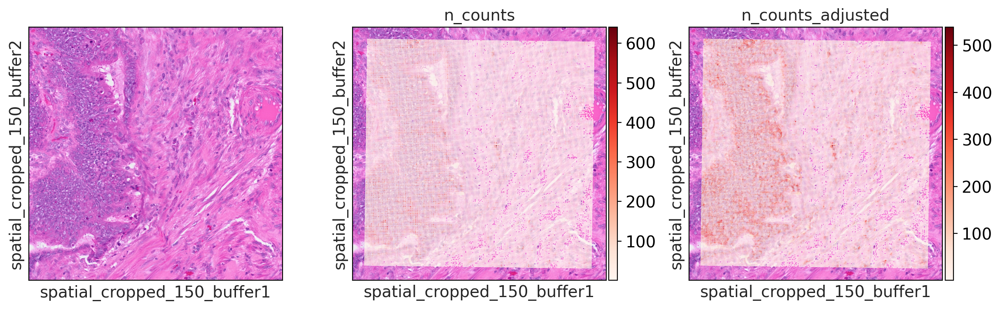

Done! Go ahead.


In [8]:
# --- 指定したROI（array_row/col）が正しく処理されているか確認 ---

# 指定ROI（array_row/col範囲）でスポット抽出＆可視化
print(f"Checking ROI: Row {mask_small_x1}-{mask_small_x2}, Col {mask_small_y1}-{mask_small_y2}")

mask = (
    (sp_adata.obs["array_row"].between(mask_small_x1, mask_small_x2))
    & (sp_adata.obs["array_col"].between(mask_small_y1, mask_small_y2))
)

if mask.any():
    # ROI領域のデータ抽出
    bdata = sp_adata[mask].copy()
    img_key = f"{mpp}_mpp_150_buffer"
    basis_key = "spatial_cropped_150_buffer"
    # ROI画像とカウント情報を表示
    sc.pl.spatial(
        bdata,
        color=[None, "n_counts", "n_counts_adjusted"],
        img_key=img_key,
        basis=basis_key,
        show=True,
        cmap="Reds",
    )
    del bdata
    print("Done! Go ahead.")
else:
    print("⚠️ Warning: No spots found in the specified ROI mask.")

## HE Image-Based Nuclei Segmentation and Label Integration

🚀 HE nuclei segmentation...
🚀 Loading image: /tmp/he.tif
   Shape: (12513, 13468, 3)
🧪 Normalizing (3% - 99.8%)...
🤖 Loading StarDist model: 2D_versatile_he
Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
📊 Running prediction (block_size=4096, context=128)...
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 16/16 [06:28<00:00, 24.26s/it]


✅ Detection complete! 314994 objects detected.
💾 Saved: /tmp/he.npz
📥 Inserting HE labels into AnnData...
🎉 Final Integration Result: 2523320 spots have nuclei assigned.
Checking ROI: Row 1024-1280, Col 1280-1536


✅ Done!


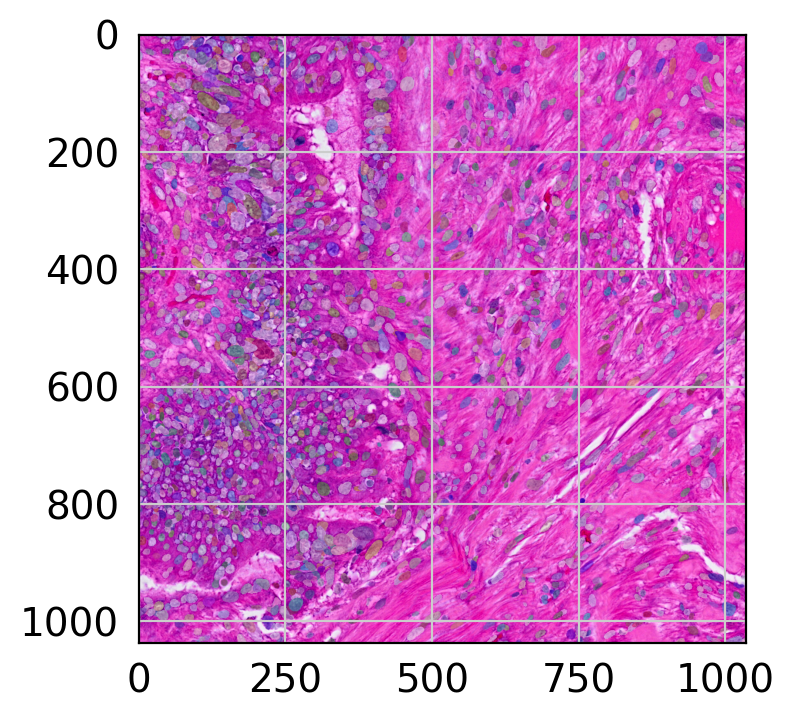

In [9]:
# =========================
# HE画像の核セグメンテーションと可視化
# =========================

print("🚀 HE nuclei segmentation...")

# --- 1. StarDistセグメンテーション実行 ---
labels_he, details = ht.segment_nuclei_stardist(
    image_path=HE_full_path,
    output_npz_path=os.path.join(TMP_PATH, "he.npz"),
    model_type="he",
    prob_thresh=prob_thresh_HE,
    nms_thresh=nms_thresh,
    block_size=STEP,
    context=128,
)

# --- 2. bin2cellに挿入 ---
print("📥 Inserting HE labels into AnnData...")
b2c.insert_labels(
    sp_adata,
    labels_npz_path=os.path.join(TMP_PATH, "he.npz"),
    basis="spatial",
    spatial_key="spatial_cropped_150_buffer",
    mpp=mpp,
    labels_key="labels_he",
)
# --- 3. 最終確認 ---
final_count = (sp_adata.obs['labels_he'] > 0).sum()
print(f"🎉 Final Integration Result: {final_count} spots have nuclei assigned.")
# 指定したROI（array_row/col）が正しく処理されているか確認
print(f"Checking ROI: Row {mask_small_x1}-{mask_small_x2}, Col {mask_small_y1}-{mask_small_y2}")

# --- 4. ROI確認と可視化 ---
mask = (
    (sp_adata.obs["array_row"].between(mask_small_x1, mask_small_x2))
    & (sp_adata.obs["array_col"].between(mask_small_y1, mask_small_y2))
)

if mask.any():
    bdata = sp_adata[mask].copy()
    bdata = bdata[bdata.obs['labels_he'] > 0]
    bdata.obs['labels_he'] = bdata.obs['labels_he'].astype(str)
    
    crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)
    rendered = b2c.view_stardist_labels(
        image_path=HE_full_path,
        labels_npz_path=os.path.join(TMP_PATH, "he.npz"),
        crop=crop
    )
    plt.imshow(rendered)
    del bdata
    print("✅ Done!")
else:
    print("⚠️ No spots in ROI.")

🔄 Expanding HE labels...
🔄 Expanding labels from 'labels_he' -> 'labels_he_expanded'
   Max bin distance: 2
computing PCA
    with n_comps=50
    finished (0:00:55)
✅ Expansion complete: 5338830 spots with labels


... storing 'labels_he_expanded' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


the obs value 'labels_he_expanded' has more than 103 categories. Uniform 'grey' color will be used for all categories.


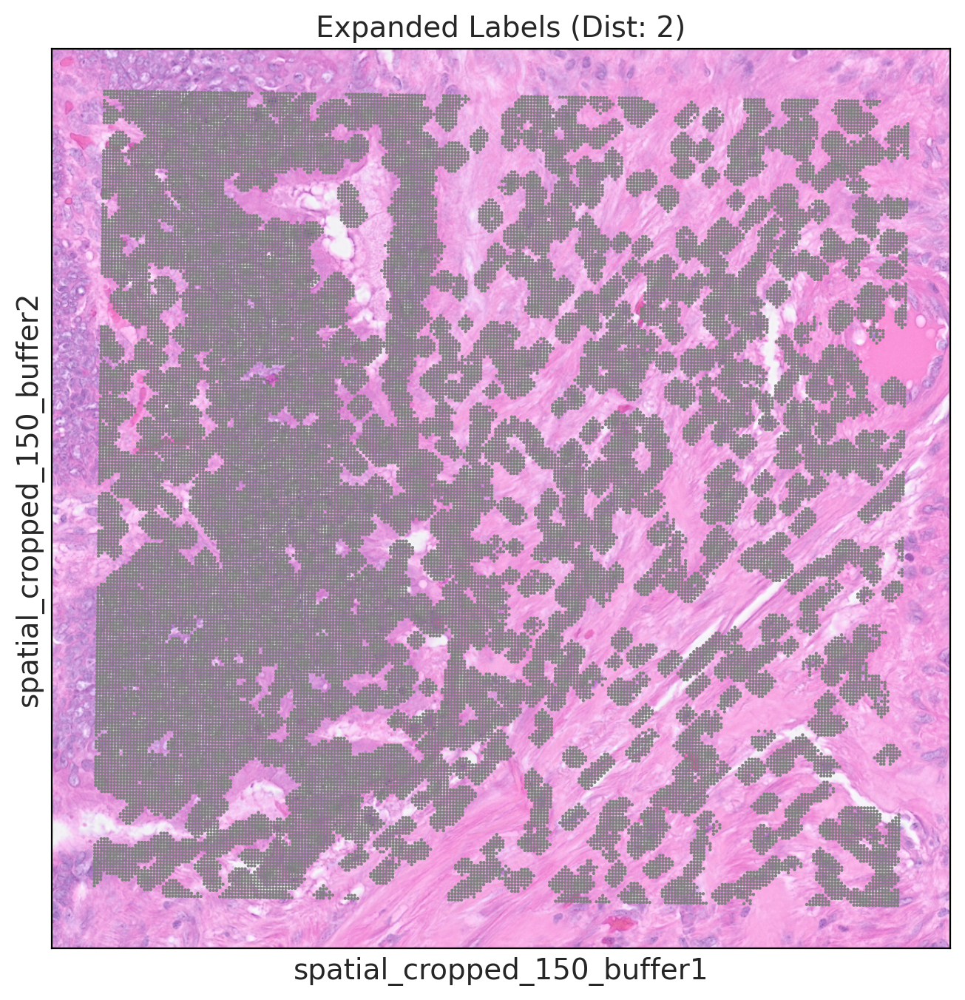

✅ Done!


In [10]:
# =========================
# 核ラベルの拡張とROI内可視化
# =========================

# --- 1. Run Label Expansion ---
print("🔄 Expanding HE labels...")
ht.expand_nuclei_labels(
    sp_adata,
    labels_key="labels_he",
    max_bin_distance=max_bin_distance,
    expanded_labels_key="labels_he_expanded",
)

# --- 2. Visualization on ROI ---
mask = (
    (sp_adata.obs["array_row"].between(mask_small_x1, mask_small_x2))
    & (sp_adata.obs["array_col"].between(mask_small_y1, mask_small_y2))
)

if mask.any():
    bdata = sp_adata[mask].copy()
    bdata = bdata[bdata.obs['labels_he_expanded'] > 0]
    bdata.obs['labels_he_expanded'] = bdata.obs['labels_he_expanded'].astype(str)
    
    fig, ax = plt.subplots(figsize=(8, 8))
    sc.pl.spatial(
        bdata,
        color=['labels_he_expanded'],
        img_key=f"{mpp}_mpp_150_buffer",
        basis="spatial_cropped_150_buffer",
        legend_loc=None,
        show=False,
        ax=ax,
        title=f"Expanded Labels (Dist: {max_bin_distance})",
        cmap="tab20",
        alpha_img=0.7,
    )
    plt.show()
    del bdata
    print("✅ Done!")
else:
    print("⚠️ ROI mask is empty.")

🚀 Starting GEX-based Segmentation...
   MPP: 0.5
   Prob Thresh (GEX): 0.7
   Save Path: /tmp/gex_image.tif
🎨 Generating grid image from 'n_counts_adjusted'...
   MPP: 0.5, Sigma: 5
✅ Grid image saved: /tmp/gex_image.tif
✅ Grid image generated.
GEX shape: (13400, 13400) uint8 0 255
🚀 Loading image: /tmp/gex_image.tif
   Shape: (13400, 13400)
🧪 Normalizing (3% - 99.8%)...
🤖 Loading StarDist model: 2D_versatile_fluo
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
📊 Running prediction (block_size=4096, context=128)...
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


100%|██████████| 16/16 [01:02<00:00,  3.90s/it]


✅ Detection complete! 32760 objects detected.
💾 Saved: /tmp/gex_labels.npz
Detected objects: 32760 max label: 32760
saved: /tmp/gex_labels.npz
spots with labels_gex > 0: 1454420


... storing 'labels_gex' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


the obs value 'labels_gex' has more than 103 categories. Uniform 'grey' color will be used for all categories.


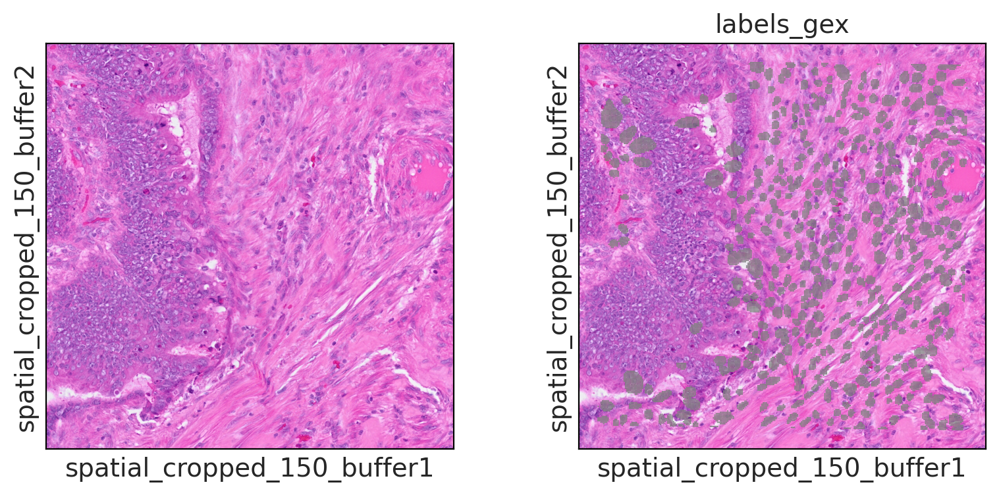

Salvaged 1883 secondary labels


... storing 'labels_joint' as categorical
... storing 'labels_joint_source' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


the obs value 'labels_joint' has more than 103 categories. Uniform 'grey' color will be used for all categories.


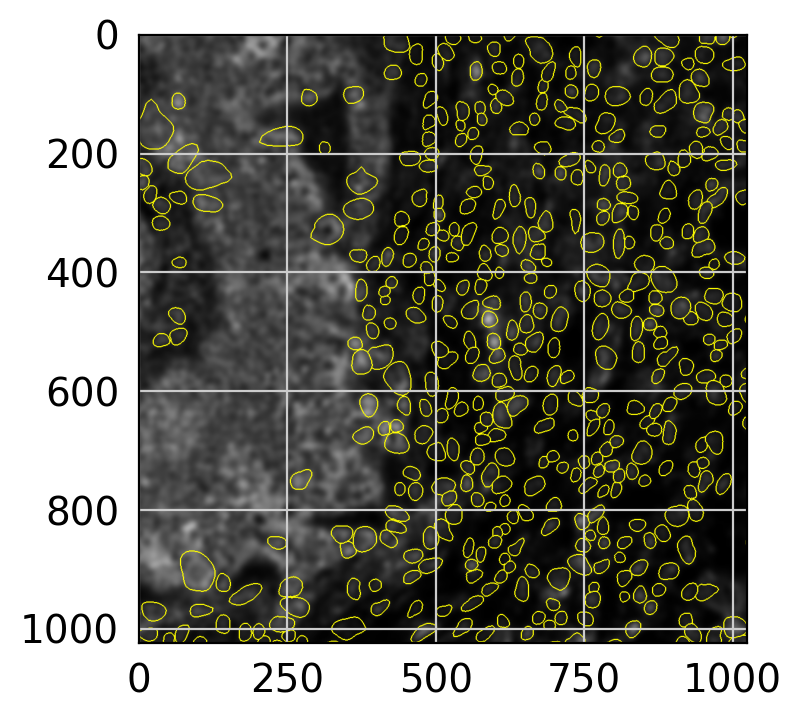

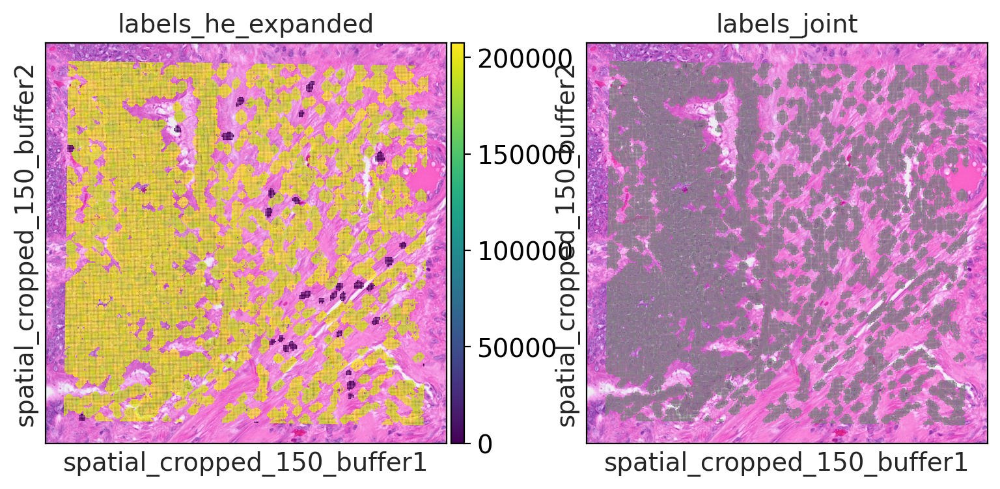

93142

In [11]:
# =========================
# GEX画像セグメンテーション・ラベル統合・可視化
# =========================


# --- 1. Setup Paths & Variables ---
gex_full_path = os.path.join(TMP_PATH, "gex_image.tif")
gex_labels_path = os.path.join(TMP_PATH, "gex_labels.npz")
if os.path.exists(gex_full_path):
    os.remove(gex_full_path)
if os.path.exists(gex_labels_path):
    os.remove(gex_labels_path)

print(f"🚀 Starting GEX-based Segmentation...")
print(f"   MPP: {mpp}")
print(f"   Prob Thresh (GEX): {prob_thresh_GEX}")
print(f"   Save Path: {gex_full_path}")

# --- 2. Generate Grid Image from Expression ---
ht.generate_gex_segment_image(
    sp_adata,
    value_key="n_counts_adjusted",
    mpp=mpp,
    sigma=5,
    output_path=gex_full_path,
)
print("✅ Grid image generated.")
img = tifffile.imread(gex_full_path)
print("GEX shape:", img.shape, img.dtype, img.min(), img.max())

# --- 3. GEXセグメンテーション実行 ---
labels_gex, details = ht.segment_nuclei_stardist(
    image_path=gex_full_path,
    output_npz_path=gex_labels_path,
    model_type="gex",
    prob_thresh=prob_thresh_GEX,
    nms_thresh=nms_thresh,
    block_size=STEP,
    context=128,
)
n_detected = len(details.get("points", []))
print("Detected objects:", n_detected, "max label:", labels_gex.max())

if os.path.exists(gex_labels_path):
    os.remove(gex_labels_path)
labels_sparse = scipy.sparse.csr_matrix(labels_gex.astype("int32"))
scipy.sparse.save_npz(gex_labels_path, labels_sparse)
print("saved:", gex_labels_path)

# --- 4. bin2cellに挿入 ---
b2c.insert_labels(
    sp_adata,
    labels_npz_path=gex_labels_path,
    basis="array",
    spatial_key=None,
    mpp=mpp,
    labels_key="labels_gex",
)
print("spots with labels_gex > 0:", (sp_adata.obs["labels_gex"] > 0).sum())

# --- 5. GEXラベル可視化 ---
mask = (
    (sp_adata.obs["array_row"].between(mask_small_x1, mask_small_x2))
    & (sp_adata.obs["array_col"].between(mask_small_y1, mask_small_y2))
)
bdata = sp_adata[mask]
bdata = bdata[bdata.obs["labels_gex"] > 0]
bdata.obs["labels_gex"] = bdata.obs["labels_gex"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_gex"],
    img_key="0.5_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
    legend_loc=None,
    show=True,
)

# --- 6. crop/view_labelsの可視化 ---
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)
rendered = b2c.view_labels(
    image_path=gex_full_path,
    labels_npz_path=gex_labels_path,
    crop=crop,
)
plt.imshow(rendered)

# --- 7. ラベル統合（HE_expanded + GEX） ---
b2c.salvage_secondary_labels(
    sp_adata,
    primary_label="labels_he_expanded",
    secondary_label="labels_gex",
    labels_key="labels_joint",
)

bdata = sp_adata[mask]
bdata = bdata[bdata.obs["labels_joint"] > 0]
bdata.obs["labels_joint"] = bdata.obs["labels_joint"].astype(str)

sc.pl.spatial(
    bdata,
    color=["labels_he_expanded", "labels_joint"],
    img_key="0.5_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
    legend_loc=None,
    save=False,
)
del bdata
gc.collect()

## Bin-to-Cell Conversion with Optional Gene Expression

In [12]:
# =========================================================
# Simple Bin2Cell Widget (Auto labels_key switching)
# =========================================================

bin2cell_w = ht.create_bin2cell_converter_widget(
    adata=sp_adata,
    roi_x1=mask_small_x1,
    roi_x2=mask_small_x2,
    roi_y1=mask_small_y1,
    roi_y2=mask_small_y2,
    mpp=mpp,
    basis="spatial_cropped_150_buffer",
    runtime_namespace=globals(),  # 実行後に cdata をグローバルに展開したい場合
)
bin2cell_w.display()

## Cell Statistics Visualization and Summary

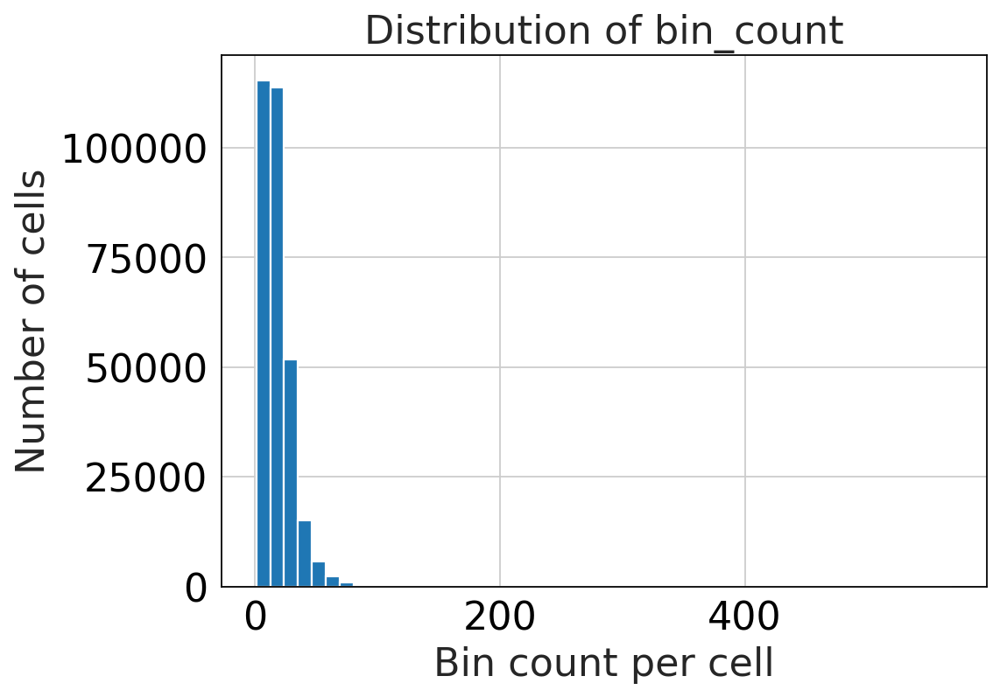

Median bin_count: 16.0
Mean bin_count: 17.63001636661211


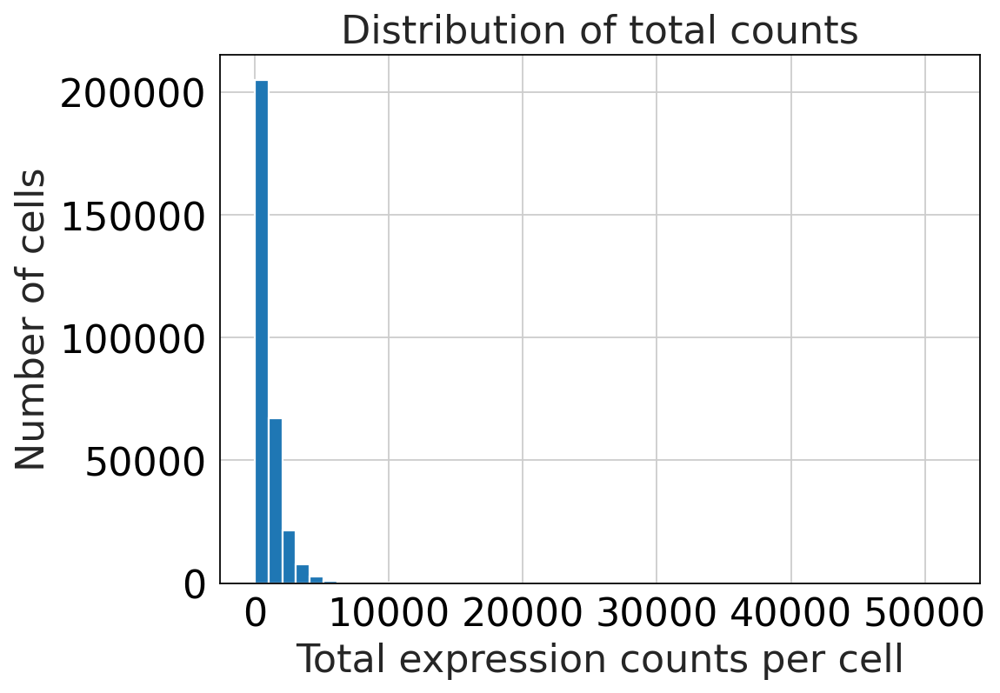

Median total counts: 673.4477273080586
Mean total counts: 960.1975582187313


In [13]:
# =========================
# Bin2Cell細胞統計の可視化・要約
# =========================

plt.figure(figsize=(7,5))
plt.hist(cdata.obs["bin_count"], bins=50)
plt.xlabel("Bin count per cell")
plt.ylabel("Number of cells")
plt.title("Distribution of bin_count")
plt.show()

print("Median bin_count:", np.median(cdata.obs["bin_count"]))
print("Mean bin_count:", np.mean(cdata.obs["bin_count"]))

if hasattr(cdata.X, "sum"):
    total_counts = np.array(cdata.X.sum(axis=1)).flatten()
else:
    total_counts = cdata.obs["total_counts"]

plt.figure(figsize=(7,5))
plt.hist(total_counts, bins=50)
plt.xlabel("Total expression counts per cell")
plt.ylabel("Number of cells")
plt.title("Distribution of total counts")
plt.show()

print("Median total counts:", np.median(total_counts))
print("Mean total counts:", np.mean(total_counts))

## AnnData Saving and Memory Cleanup

In [14]:
# =========================
# AnnData保存ウィジェット
# =========================

c_path = os.path.join(RESULTS_PATH, SAMPLE_NAME + "_b2c.h5ad")
s_path = os.path.join(RESULTS_PATH, SAMPLE_NAME + "_2um.h5ad")

# AnnData保存
save_widget = ht.create_save_anndata_widget(
    cdata=cdata,
    cdata_path=c_path,
    sp_adata=sp_adata,
    sp_adata_path=s_path,
    runtime_namespace=globals(),  # メモリ削除をglobals()に反映
)
save_widget.display()

## Go to next notebook.
- With single cell data -> single_cell_annotation_tutorial
- Without single cell data -> label_transfer_tutorial_without_single_cell_data